# About Dataset

## Bank Customer Segmentation

Most banks have a large customer base - with different characteristics in terms of age, income, values, lifestyle, and more. Customer segmentation is the process of dividing a customer dataset into specific groups based on shared traits.

According to a report from Ernst & Young, “A more granular understanding of consumers is no longer a nice-to-have item, but a strategic and competitive imperative for banking providers. Customer understanding should be a living, breathing part of everyday business, with insights underpinning the full range of banking operations.

## About this Dataset
This dataset consists of 1 Million+ transaction by over 800K customers for a bank in India. The data contains information such as - customer age (DOB), location, gender, account balance at the time of the transaction, transaction details, transaction amount, etc.

### Get the dataset at: https://www.kaggle.com/datasets/shivamb/bank-customer-segmentation

## Analysis Ideas
The dataset can be used for different analysis, example -

* Perform Clustering / Segmentation on the dataset and identify popular customer groups along with their definitions/rules
* Perform Location-wise analysis to identify regional trends in India
* Perform transaction-related analysis to identify interesting trends that can be used by a bank to improve / optimi their user experiences
* Customer Recency, Frequency, Monetary(RFM) analysis

### This notebook contains the EDA and unsupervised learning method(K-Means) of the bank dataset

In [1]:
# libs
import pandas as pd
import datetime
import math
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib.cm as cm
import warnings

from IPython.core.display import HTML
import seaborn as sns
from scipy.stats import norm
from sklearn import preprocessing
import math

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import plotly as py
import plotly.graph_objs as go

import os
%matplotlib inline

In [2]:
# To center our generated images
HTML("""
<style>
.output_png {
    display: table-cell;
    text-align: center;
    vertical-align: middle;
}
</style>
""")

In [3]:
df = pd.read_csv("D:\\DataSc\\Datasets\\bank_transactions.csv")
df.head()

,TransactionID,CustomerID,CustomerDOB,CustGender,CustLocation,CustAccountBalance,TransactionDate,TransactionTime,TransactionAmount (INR)
0,T1,C5841053,10/1/94,F,JAMSHEDPUR,17819.05,2/8/16,143207,25.0
1,T2,C2142763,4/4/57,M,JHAJJAR,2270.69,2/8/16,141858,27999.0
2,T3,C4417068,26/11/96,F,MUMBAI,17874.44,2/8/16,142712,459.0
3,T4,C5342380,14/9/73,F,MUMBAI,866503.21,2/8/16,142714,2060.0
4,T5,C9031234,24/3/88,F,NAVI MUMBAI,6714.43,2/8/16,181156,1762.5


## Data Exploration & Feature Manipulation

In [4]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048567 entries, 0 to 1048566
Data columns (total 9 columns):
 #   Column                   Non-Null Count    Dtype  
---  ------                   --------------    -----  
 0   TransactionID            1048567 non-null  object 
 1   CustomerID               1048567 non-null  object 
 2   CustomerDOB              1045170 non-null  object 
 3   CustGender               1047467 non-null  object 
 4   CustLocation             1048416 non-null  object 
 5   CustAccountBalance       1046198 non-null  float64
 6   TransactionDate          1048567 non-null  object 
 7   TransactionTime          1048567 non-null  int64  
 8   TransactionAmount (INR)  1048567 non-null  float64
dtypes: float64(2), int64(1), object(6)
memory usage: 72.0+ MB
None


In [5]:
print('*' * 70)
for col in df:
    print(col, "   :", df[col].unique().shape)
print('*' * 70)

# Top customer contribution
(df.CustomerID.value_counts()/sum(df.CustomerID.value_counts())*100).head(20).cumsum()

**********************************************************************
TransactionID    : (1048567,)
CustomerID    : (884265,)
CustomerDOB    : (17255,)
CustGender    : (4,)
CustLocation    : (9356,)
CustAccountBalance    : (161329,)
TransactionDate    : (55,)
TransactionTime    : (81918,)
TransactionAmount (INR)    : (93024,)
**********************************************************************


C5533885    0.000572
C6624352    0.001144
C1736254    0.001717
C6735477    0.002289
C1113684    0.002861
C1026833    0.003433
C7537344    0.004005
C5418253    0.004578
C4327447    0.005150
C4021562    0.005722
C4513786    0.006294
C6222360    0.006867
C3226689    0.007439
C5531319    0.008011
C3510087    0.008488
C4423377    0.008965
C6111775    0.009441
C8936730    0.009918
C2927851    0.010395
C7439117    0.010872
Name: CustomerID, dtype: float64

In [6]:
df.isna().sum()

TransactionID                 0
CustomerID                    0
CustomerDOB                3397
CustGender                 1100
CustLocation                151
CustAccountBalance         2369
TransactionDate               0
TransactionTime               0
TransactionAmount (INR)       0
dtype: int64

In [7]:
df.CustomerID.unique().shape

(884265,)

In [8]:
cust_df = df.groupby(["CustomerID"]).count().reset_index()
cust_df.head(10)

,CustomerID,TransactionID,CustomerDOB,CustGender,CustLocation,CustAccountBalance,TransactionDate,TransactionTime,TransactionAmount (INR)
0,C1010011,2,2,2,2,2,2,2,2
1,C1010012,1,1,1,1,1,1,1,1
2,C1010014,2,2,2,2,2,2,2,2
3,C1010018,1,1,1,1,1,1,1,1
4,C1010024,1,1,1,1,1,1,1,1
5,C1010028,1,1,1,1,1,1,1,1
6,C1010031,2,2,2,2,2,2,2,2
7,C1010035,2,2,2,2,2,2,2,2
8,C1010036,1,1,1,1,1,1,1,1
9,C1010037,1,1,1,1,1,1,1,1


In [9]:
# convert to datetime format
df['Tran_Date'] = pd.to_datetime(df.TransactionDate, format = '%d/%m/%y')
df['Birth_Date'] = pd.to_datetime(df.CustomerDOB)
df.loc[df['Birth_Date'].dt.year >= 2016, 'Birth_Date'] -= pd.DateOffset(years=100)

df.head(10)

,TransactionID,CustomerID,CustomerDOB,CustGender,CustLocation,CustAccountBalance,TransactionDate,TransactionTime,TransactionAmount (INR),Tran_Date,Birth_Date
0,T1,C5841053,10/1/94,F,JAMSHEDPUR,17819.05,2/8/16,143207,25.00,2016-08-02,1994-10-01
1,T2,C2142763,4/4/57,M,JHAJJAR,2270.69,2/8/16,141858,27999.00,2016-08-02,1957-04-04
2,T3,C4417068,26/11/96,F,MUMBAI,17874.44,2/8/16,142712,459.00,2016-08-02,1996-11-26
3,T4,C5342380,14/9/73,F,MUMBAI,866503.21,2/8/16,142714,2060.00,2016-08-02,1973-09-14
4,T5,C9031234,24/3/88,F,NAVI MUMBAI,6714.43,2/8/16,181156,1762.50,2016-08-02,1988-03-24
5,T6,C1536588,8/10/72,F,ITANAGAR,53609.20,2/8/16,173940,676.00,2016-08-02,1972-08-10
6,T7,C7126560,26/1/92,F,MUMBAI,973.46,2/8/16,173806,566.00,2016-08-02,1992-01-26
7,T8,C1220223,27/1/82,M,MUMBAI,95075.54,2/8/16,170537,148.00,2016-08-02,1982-01-27
8,T9,C8536061,19/4/88,F,GURGAON,14906.96,2/8/16,192825,833.00,2016-08-02,1988-04-19
9,T10,C6638934,22/6/84,M,MUMBAI,4279.22,2/8/16,192446,289.11,2016-08-02,1984-06-22


In [10]:
# finding customer date(transaction date - date of birth)
df['Customer_Age'] = df.Tran_Date.dt.year - df.Birth_Date.dt.year
df.head(10)

,TransactionID,CustomerID,CustomerDOB,CustGender,CustLocation,CustAccountBalance,TransactionDate,TransactionTime,TransactionAmount (INR),Tran_Date,Birth_Date,Customer_Age
0,T1,C5841053,10/1/94,F,JAMSHEDPUR,17819.05,2/8/16,143207,25.00,2016-08-02,1994-10-01,22.0
1,T2,C2142763,4/4/57,M,JHAJJAR,2270.69,2/8/16,141858,27999.00,2016-08-02,1957-04-04,59.0
2,T3,C4417068,26/11/96,F,MUMBAI,17874.44,2/8/16,142712,459.00,2016-08-02,1996-11-26,20.0
3,T4,C5342380,14/9/73,F,MUMBAI,866503.21,2/8/16,142714,2060.00,2016-08-02,1973-09-14,43.0
4,T5,C9031234,24/3/88,F,NAVI MUMBAI,6714.43,2/8/16,181156,1762.50,2016-08-02,1988-03-24,28.0
5,T6,C1536588,8/10/72,F,ITANAGAR,53609.20,2/8/16,173940,676.00,2016-08-02,1972-08-10,44.0
6,T7,C7126560,26/1/92,F,MUMBAI,973.46,2/8/16,173806,566.00,2016-08-02,1992-01-26,24.0
7,T8,C1220223,27/1/82,M,MUMBAI,95075.54,2/8/16,170537,148.00,2016-08-02,1982-01-27,34.0
8,T9,C8536061,19/4/88,F,GURGAON,14906.96,2/8/16,192825,833.00,2016-08-02,1988-04-19,28.0
9,T10,C6638934,22/6/84,M,MUMBAI,4279.22,2/8/16,192446,289.11,2016-08-02,1984-06-22,32.0


In [11]:
df.CustGender.value_counts()

M    765530
F    281936
T         1
Name: CustGender, dtype: int64

In [12]:
df.CustLocation.value_counts().head(20)

MUMBAI         103595
NEW DELHI       84928
BANGALORE       81555
GURGAON         73818
DELHI           71019
NOIDA           32784
CHENNAI         30009
PUNE            25851
HYDERABAD       23049
THANE           21505
KOLKATA         19974
GHAZIABAD       15834
NAVI MUMBAI     13080
AHMEDABAD       12264
FARIDABAD       11318
JAIPUR           9921
CHANDIGARH       9526
LUCKNOW          7763
MOHALI           6741
SURAT            5770
Name: CustLocation, dtype: int64

In [13]:
# Remove negative or zero transaction
df = df[~(df["TransactionAmount (INR)"] < 0)]

# Remove ages with more than 120 years 
df = df[~(df["Customer_Age"] > 120)]

# Remove CustomerID with null 
df = df[~(df.CustomerID.isnull())]

# Remove CustomerDOB with None 
df = df[~(df.CustomerDOB.isna())]

# Remove CustomerGender with None
df = df[~(df.CustGender.isna())]

# remove Customer location with none
df = df[~(df.CustLocation.isna())]

# remove customers with none current balance 
df = df[~(df.CustAccountBalance.isna())]

In [14]:
df.isna().sum()

TransactionID              0
CustomerID                 0
CustomerDOB                0
CustGender                 0
CustLocation               0
CustAccountBalance         0
TransactionDate            0
TransactionTime            0
TransactionAmount (INR)    0
Tran_Date                  0
Birth_Date                 0
Customer_Age               0
dtype: int64

In [15]:
df.shape

(985322, 12)

In [16]:
df_new = df
df_new = df_new.drop(['TransactionDate', 'CustomerDOB', 'TransactionTime'], axis=1)
df_new = df_new.rename(columns = {'TransactionID': 'transactionID', 
                                  'CustomerID': 'customerID', 
                                  'CustGender': 'gender',
                                  'CustLocation': 'location',
                                  'CustAccountBalance': 'account_balance',
                                  'TransactionAmount (INR)': 'transaction_amount',
                                  'Tran_Date': 'transaction_date',
                                  'Birth_Date': 'birth_date',
                                  'Customer_Age': 'age'})
df_new.head()

,transactionID,customerID,gender,location,account_balance,transaction_amount,transaction_date,birth_date,age
0,T1,C5841053,F,JAMSHEDPUR,17819.05,25.0,2016-08-02,1994-10-01,22.0
1,T2,C2142763,M,JHAJJAR,2270.69,27999.0,2016-08-02,1957-04-04,59.0
2,T3,C4417068,F,MUMBAI,17874.44,459.0,2016-08-02,1996-11-26,20.0
3,T4,C5342380,F,MUMBAI,866503.21,2060.0,2016-08-02,1973-09-14,43.0
4,T5,C9031234,F,NAVI MUMBAI,6714.43,1762.5,2016-08-02,1988-03-24,28.0


## EDA

Text(0, 0.5, 'Frequency')

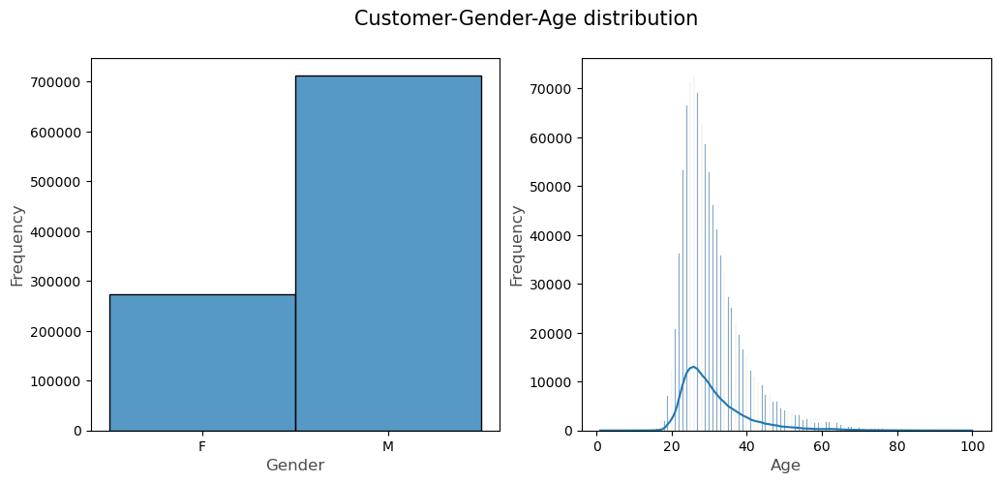

In [17]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
f.suptitle('Customer-Gender-Age distribution', fontsize=15)

sns.histplot(x = df_new.gender, data = df_new, ax = ax1)
ax1.set_xlabel("Gender", size=12, alpha=0.7)
ax1.set_ylabel("Frequency", size=12, alpha=0.7)

sns.histplot(x = df_new.age, kde=True, data = df_new, ax = ax2)
ax2.set_xlabel("Age", size=12, alpha=0.7)
ax2.set_ylabel("Frequency", size=12, alpha=0.7)

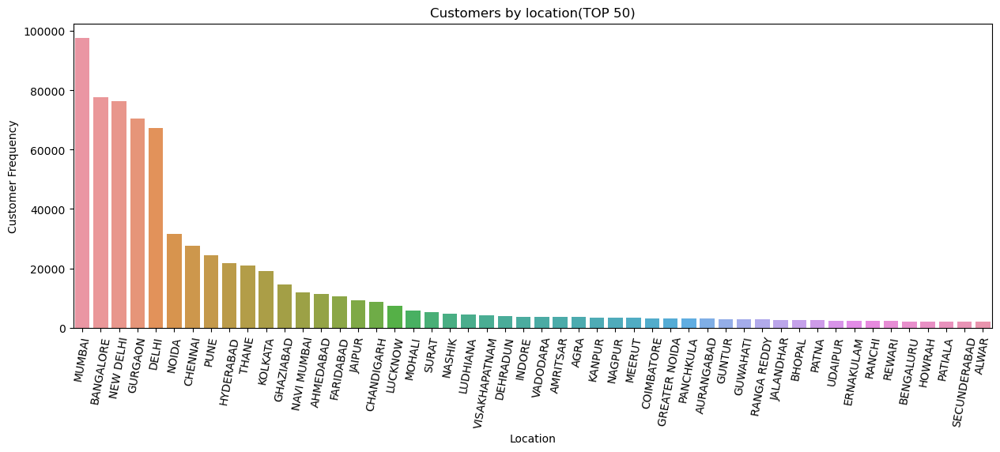

<Figure size 640x480 with 0 Axes>

In [18]:
figure, axes = plt.subplots( figsize=(15, 5))

sns.countplot(x = "location", data = df_new, order = df_new['location'].value_counts().iloc[:50].index).set(title='Customers by location(TOP 50)')
plt.xlabel("Location")
plt.xticks(rotation = 80)
plt.ylabel("Customer Frequency")

plt.show()
plt.tight_layout()

(1000.0, 80000.0)

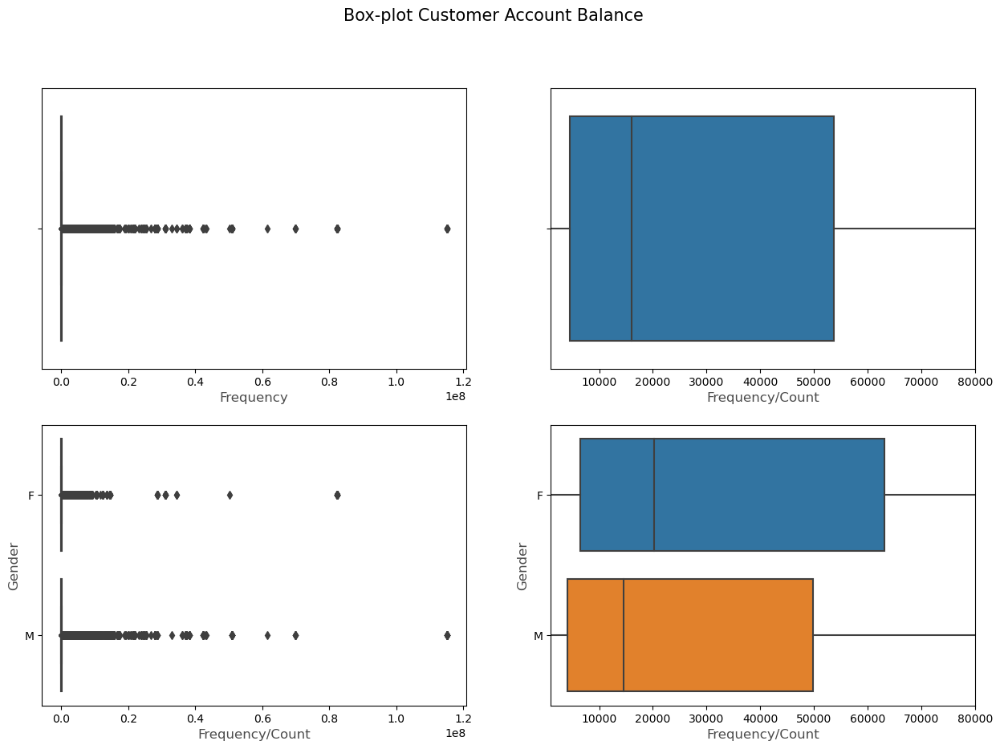

In [19]:
f, ([ax1, ax2], [ax3, ax4]) = plt.subplots(2, 2, figsize=(15, 10))
f.suptitle('Box-plot Customer Account Balance', fontsize=15)

sns.boxplot(x = df_new['account_balance'], data = df_new, ax = ax1)
ax1.set_xlabel("Frequency", size=12, alpha=0.7)

sns.boxplot(x = df_new['account_balance'], data = df_new, ax = ax2)
ax2.set_xlabel("Frequency/Count", size=12, alpha=0.7)
ax2.set_xlim([1000, 80000])

sns.boxplot(x = df_new['account_balance'], y = df_new.gender,  data = df_new, ax = ax3)
ax3.set_xlabel("Frequency/Count", size=12, alpha=0.7)
ax3.set_ylabel("Gender", size=12, alpha=0.7)

sns.boxplot(x = df_new['account_balance'], y = df_new.gender, data = df_new, ax = ax4)
ax4.set_xlabel("Frequency/Count", size=12, alpha=0.7)
ax4.set_ylabel("Gender", size=12, alpha=0.7)
ax4.set_xlim([1000, 80000])

(0.0, 2500.0)

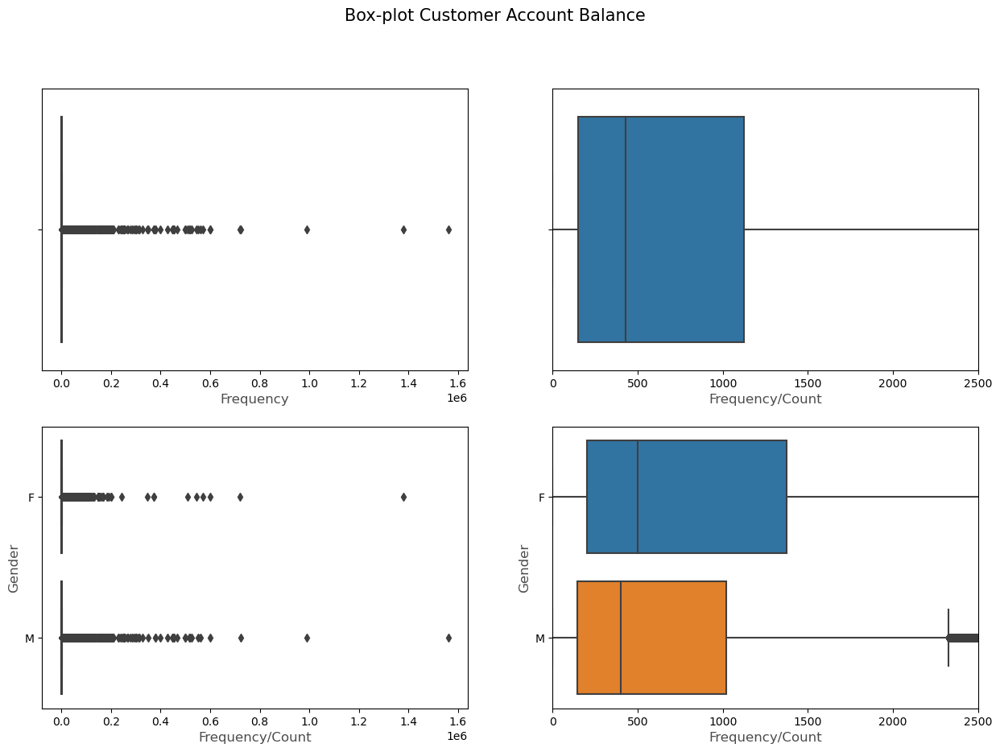

In [20]:
f, ([ax1, ax2], [ax3, ax4]) = plt.subplots(2, 2, figsize=(15, 10))
f.suptitle('Box-plot Customer Account Balance', fontsize=15)

sns.boxplot(x = df_new['transaction_amount'], data = df_new, ax = ax1)
ax1.set_xlabel("Frequency", size=12, alpha=0.7)

sns.boxplot(x = df_new['transaction_amount'], data = df_new, ax = ax2)
ax2.set_xlabel("Frequency/Count", size=12, alpha=0.7)
ax2.set_xlim([0, 2500])

sns.boxplot(x = df_new['transaction_amount'], y = df_new.gender,  data = df_new, ax = ax3)
ax3.set_xlabel("Frequency/Count", size=12, alpha=0.7)
ax3.set_ylabel("Gender", size=12, alpha=0.7)

sns.boxplot(x = df_new['transaction_amount'], y = df_new.gender, data = df_new, ax = ax4)
ax4.set_xlabel("Frequency/Count", size=12, alpha=0.7)
ax4.set_ylabel("Gender", size=12, alpha=0.7)
ax4.set_xlim([0, 2500])

*******************************************************************************************************************************
**Customer Segmentation:** Customer segmentation is the problem of uncovering info about a company's/firm's customer base, based on their interaction with the business.

Customer Segmentation can help an organization in multitude of ways like:
* Customer Understanding
* Target Marketing
* Optimal Product Placement
* Finding Latent Customer Segments
* Higher Revenue generation

## RFM model

The RFM model is a popular model in marketing and customer segmentation for determining a customer's value. The RFM model will take the transactions of a customer and calculate three important informational attribute about each customer:

* **Recency:**         The value of how recently a customer purchased at the establishment.
* **Frequency:**       How Frequent the csutomer's transaction are at the establishment.
* **Monetary value:**  The price value of all transactions that the customer made.

A combination of these values are assigned to a customer, and we can then classify the customer based on the combination.
*******************************************************************************************************************************

In [21]:
print(df_new['transaction_date'].max())
print(df_new['transaction_date'].min())

# creating a reference date
ref_date = df_new.transaction_date.max()
ref_date = ref_date + datetime.timedelta(days = 1)
print(ref_date)

2016-10-21 00:00:00
2016-08-01 00:00:00
2016-10-22 00:00:00


In [22]:
df_new['days_since_last_purchase'] = ref_date - df_new.transaction_date
df_new['days_since_last_purchase'] = df_new['days_since_last_purchase'].astype('timedelta64[D]')
df_new.head()

,transactionID,customerID,gender,location,account_balance,transaction_amount,transaction_date,birth_date,age,days_since_last_purchase
0,T1,C5841053,F,JAMSHEDPUR,17819.05,25.0,2016-08-02,1994-10-01,22.0,81.0
1,T2,C2142763,M,JHAJJAR,2270.69,27999.0,2016-08-02,1957-04-04,59.0,81.0
2,T3,C4417068,F,MUMBAI,17874.44,459.0,2016-08-02,1996-11-26,20.0,81.0
3,T4,C5342380,F,MUMBAI,866503.21,2060.0,2016-08-02,1973-09-14,43.0,81.0
4,T5,C9031234,F,NAVI MUMBAI,6714.43,1762.5,2016-08-02,1988-03-24,28.0,81.0


In [23]:
df_new.location.value_counts()

MUMBAI                       97679
BANGALORE                    77751
NEW DELHI                    76380
GURGAON                      70518
DELHI                        67335
                             ...  
KAMALPUR                         1
JUFFAIR                          1
CHAKALA ANDHERI -E MUMBAI        1
CORPORATION THANE                1
IMPERIA THANE WEST               1
Name: location, Length: 8164, dtype: int64

*******************************************************************************************************************************
For this project I'll be using the customer data from MUMBAI only. As there are 900K entries, my laptop would take too much time to process the entire dataset. Therefore, I will try to identify different bank customer group from Mumbai to showcase customer segmentation.
*******************************************************************************************************************************

In [24]:
df_mmb = df_new[df_new['location'] == 'MUMBAI']
df_mmb.head()

,transactionID,customerID,gender,location,account_balance,transaction_amount,transaction_date,birth_date,age,days_since_last_purchase
2,T3,C4417068,F,MUMBAI,17874.44,459.00,2016-08-02,1996-11-26,20.0,81.0
3,T4,C5342380,F,MUMBAI,866503.21,2060.00,2016-08-02,1973-09-14,43.0,81.0
6,T7,C7126560,F,MUMBAI,973.46,566.00,2016-08-02,1992-01-26,24.0,81.0
7,T8,C1220223,M,MUMBAI,95075.54,148.00,2016-08-02,1982-01-27,34.0,81.0
9,T10,C6638934,M,MUMBAI,4279.22,289.11,2016-08-02,1984-06-22,32.0,81.0


In [25]:
df_mmb.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 97679 entries, 2 to 1048544
Data columns (total 10 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   transactionID             97679 non-null  object        
 1   customerID                97679 non-null  object        
 2   gender                    97679 non-null  object        
 3   location                  97679 non-null  object        
 4   account_balance           97679 non-null  float64       
 5   transaction_amount        97679 non-null  float64       
 6   transaction_date          97679 non-null  datetime64[ns]
 7   birth_date                97679 non-null  datetime64[ns]
 8   age                       97679 non-null  float64       
 9   days_since_last_purchase  97679 non-null  float64       
dtypes: datetime64[ns](2), float64(4), object(4)
memory usage: 8.2+ MB


## Recency

In [26]:
cust_hist_df = df_mmb.groupby("customerID").min().reset_index()[['customerID', 'days_since_last_purchase']]
cust_hist_df.rename(columns={'days_since_last_purchase':'recency'}, inplace=True)

In [27]:
cust_hist_df.head(10)

,customerID,recency
0,C1010012,69.0
1,C1010014,76.0
2,C1010035,82.0
3,C1010060,56.0
4,C1010078,82.0
5,C1010087,72.0
6,C1010168,42.0
7,C1010224,67.0
8,C1010273,73.0
9,C1010334,57.0


In [28]:
cust_hist_df.recency.describe()

count    96037.000000
mean        57.732822
std         15.132144
min          1.000000
25%         46.000000
50%         58.000000
75%         70.000000
max         82.000000
Name: recency, dtype: float64

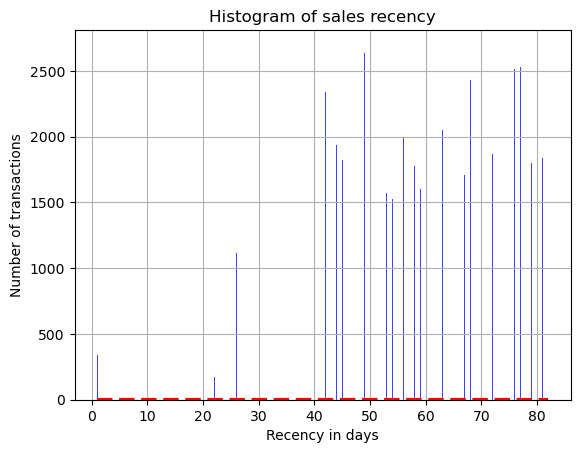

In [29]:
x = cust_hist_df.recency
mu = np.mean(cust_hist_df.recency)
sigma = math.sqrt(np.var(cust_hist_df.recency))
n, bins, patches = plt.hist(x, 1000, facecolor='blue', alpha=0.75)

y = norm.pdf(bins, mu, sigma)
l = plt.plot(bins, y, 'r--', linewidth = 3)
plt.xlabel('Recency in days')
plt.ylabel('Number of transactions')
plt.title('Histogram of sales recency')
plt.grid(True)

## Frequency & Monetary values

In [30]:
# Build Frequency and Monetary value Features
cust_mon_val = df_mmb[['customerID', 'transaction_amount']].groupby("customerID").sum().reset_index()

# Merge both datasets
cust_hist_df = cust_hist_df.merge(cust_mon_val, how='outer')
cust_hist_df.rename(columns={'transaction_amount':'amount'}, inplace=True)

cust_hist_df.head(10)

,customerID,recency,amount
0,C1010012,69.0,1499.0
1,C1010014,76.0,1455.0
2,C1010035,82.0,50.0
3,C1010060,56.0,16000.0
4,C1010078,82.0,124.0
5,C1010087,72.0,42.0
6,C1010168,42.0,50.0
7,C1010224,67.0,835.5
8,C1010273,73.0,1040.0
9,C1010334,57.0,1165.0


In [31]:
cust_hist_df.amount = cust_hist_df.amount + 0.001

cust_freq = df_mmb[['customerID', 'transaction_amount']].groupby("customerID").count().reset_index()
cust_freq.rename(columns={'transaction_amount':'frequency'}, inplace=True)
cust_hist_df = cust_hist_df.merge(cust_freq, how = 'outer')
cust_hist_df.head()

,customerID,recency,amount,frequency
0,C1010012,69.0,1499.001,1
1,C1010014,76.0,1455.001,2
2,C1010035,82.0,50.001,1
3,C1010060,56.0,16000.001,1
4,C1010078,82.0,124.001,1


## Data Preprocessing

We will transform all the variables to log scale. This log scale transformation along with the standardization, will ensure that the input to our models will be homogeneous.

In [32]:
cust_hist_df['recency_log'] = cust_hist_df['recency'].apply(math.log)
cust_hist_df['frequncy_log'] = cust_hist_df['frequency'].apply(math.log)
cust_hist_df['amount_log'] = cust_hist_df['amount'].apply(math.log)

feature_vectors = ['amount_log', 'frequncy_log', 'recency_log']
X_subset = cust_hist_df[feature_vectors].values

In [33]:
scaler = preprocessing.StandardScaler().fit(X_subset)
X_scaled = scaler.transform(X_subset)

In [34]:
X_scaled

array([[ 0.65632368, -0.13063437,  0.61342197],
       [ 0.63731695,  7.55456355,  0.87618725],
       [-1.51311686, -0.13063437,  1.08282196],
       ...,
       [-0.62870551, -0.13063437, -0.37345669],
       [-1.51311686, -0.13063437,  0.0938698 ],
       [ 0.2994362 , -0.13063437, -1.08126587]])

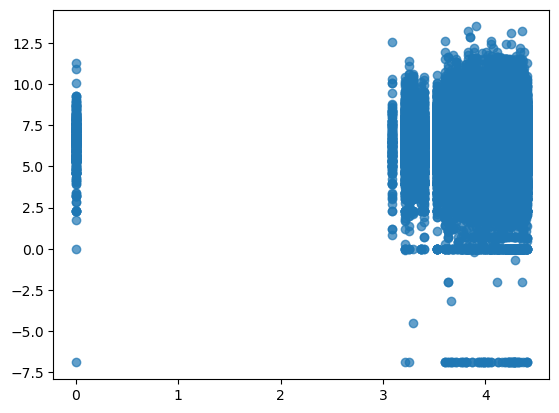

In [35]:
plt.scatter(cust_hist_df.recency_log, cust_hist_df.amount_log, alpha = 0.7)

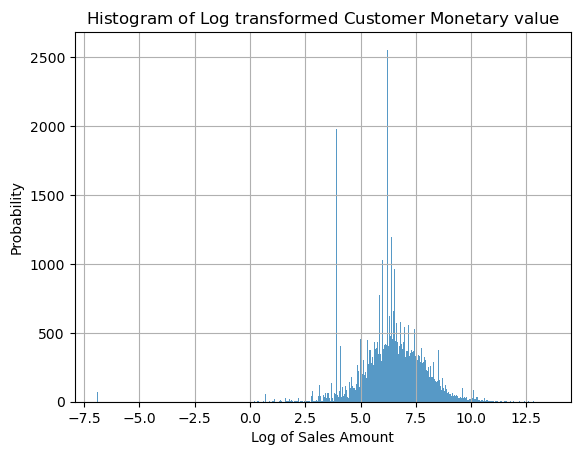

In [36]:
x = cust_hist_df.amount_log
n, bins, patches = plt.hist(x, 1000, alpha=0.75)
plt.xlabel('Log of Sales Amount')
plt.ylabel('Probability')
plt.title(r'$\mathrm{Histogram\ of\ Log\ transformed\ Customer\ Monetary\ value}\ $')
plt.grid(True)

In [37]:
cust_hist_df.head(10)

,customerID,recency,amount,frequency,recency_log,frequncy_log,amount_log
0,C1010012,69.0,1499.001,1,4.234107,0.000000,7.312554
1,C1010014,76.0,1455.001,2,4.330733,0.693147,7.282762
2,C1010035,82.0,50.001,1,4.406719,0.000000,3.912043
3,C1010060,56.0,16000.001,1,4.025352,0.000000,9.680344
4,C1010078,82.0,124.001,1,4.406719,0.000000,4.820290
5,C1010087,72.0,42.001,1,4.276666,0.000000,3.737693
6,C1010168,42.0,50.001,1,3.737670,0.000000,3.912043
7,C1010224,67.0,835.501,1,4.204693,0.000000,6.728032
8,C1010273,73.0,1040.001,1,4.290459,0.000000,6.946977
9,C1010334,57.0,1165.001,1,4.043051,0.000000,7.060477


Text(0.5, 0, 'Monetary')

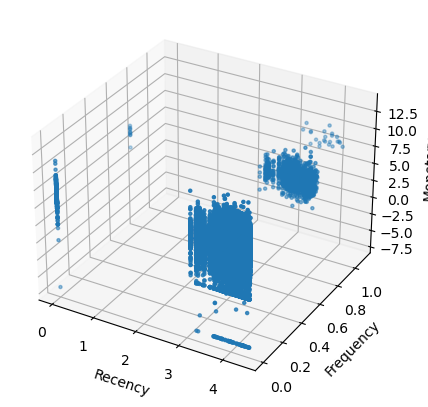

In [38]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize = (5, 5))
ax = fig.add_subplot(111, projection='3d')

xs = cust_hist_df.recency_log
ys = cust_hist_df.frequncy_log
zs = cust_hist_df.amount_log
ax.scatter(xs, ys, zs, s=5)

ax.set_xlabel('Recency')
ax.set_ylabel('Frequency')
ax.set_zlabel('Monetary')

# K-Means 

K-Means clustering belongs to the partition based\centroid based clustering family of algo. It's one of the simplest clustering algorithm.

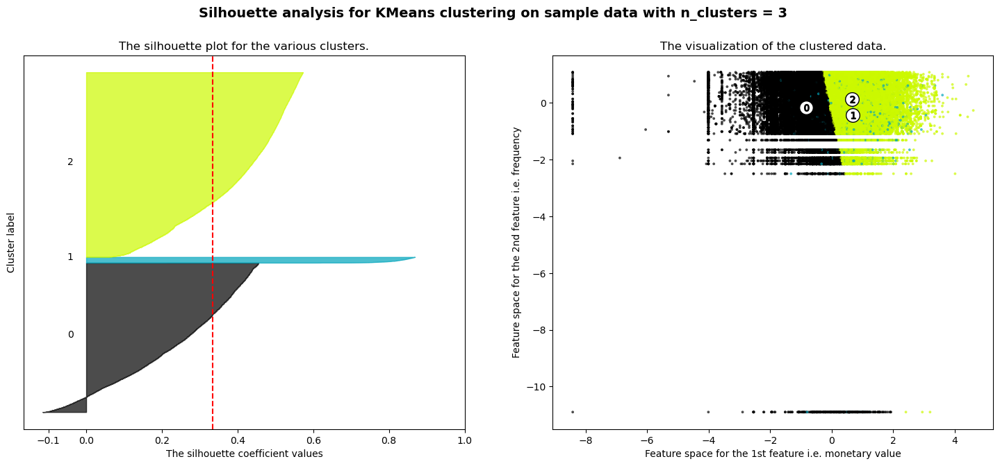

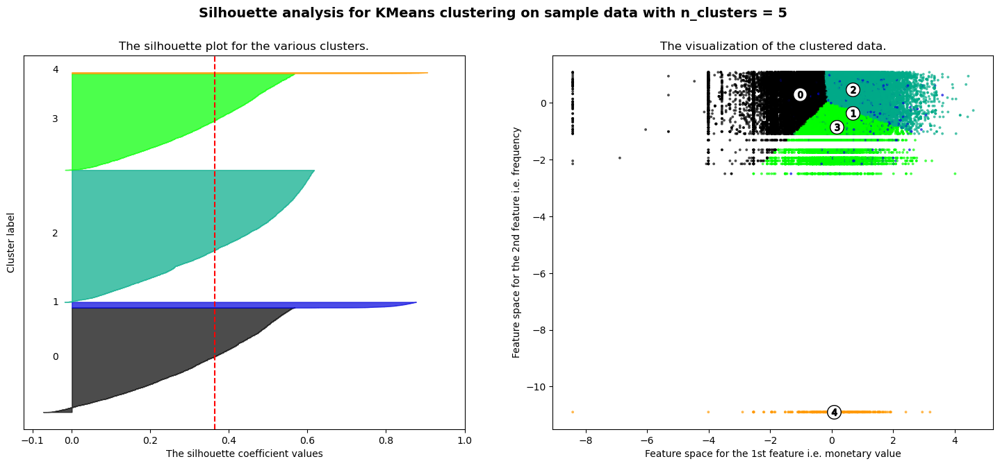

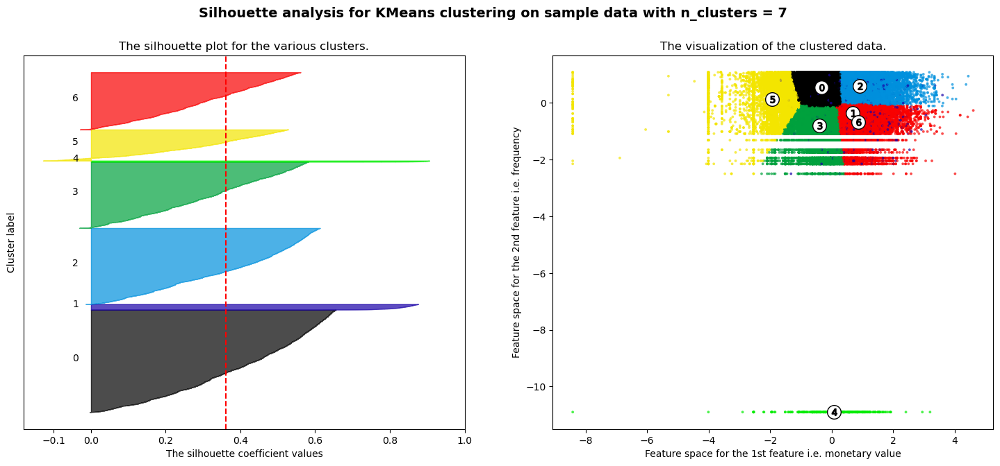

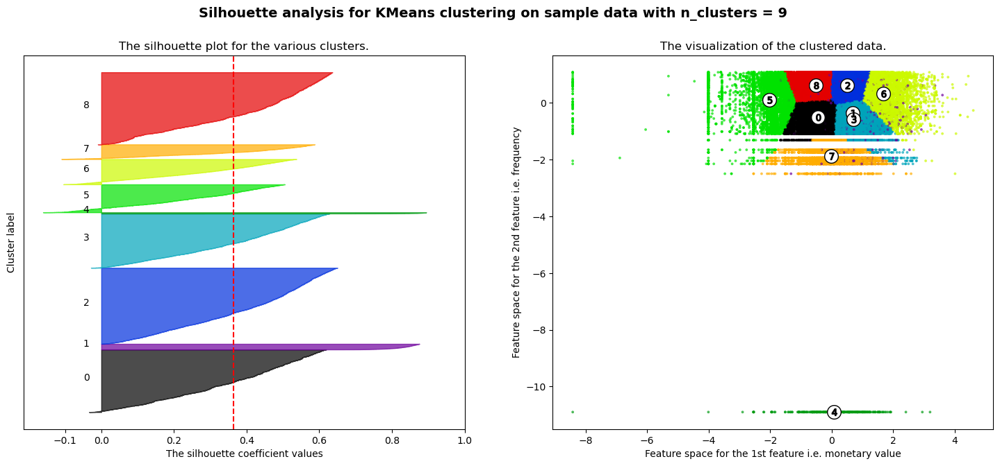

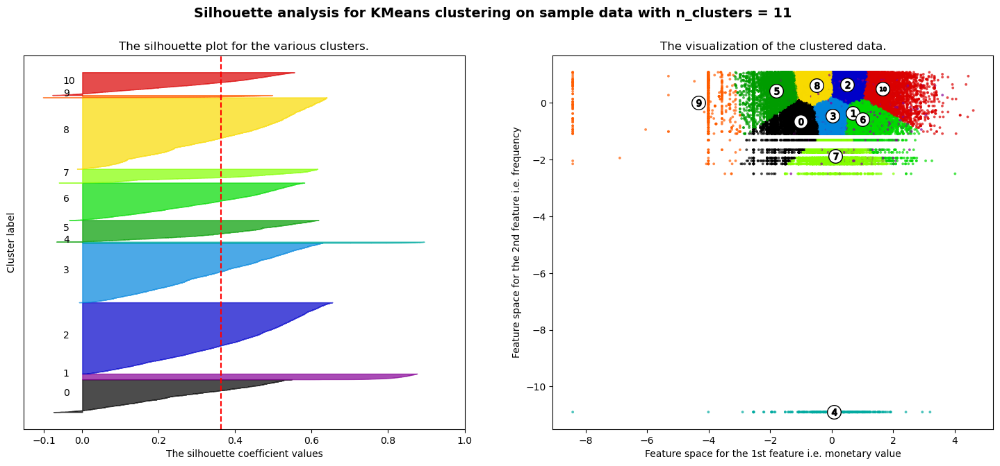

In [39]:
X = X_scaled
cluster_centers = dict()

for n_clusters in range(3, 12, 2):
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    
    clusterer = KMeans(n_clusters = n_clusters, n_init = 'auto', random_state = 11)
    cluster_labels = clusterer.fit_predict(X)
    
    silhoutte_avg = silhouette_score(X, cluster_labels)
    
    cluster_centers.update({ n_clusters :{
                                        'cluster_center':clusterer.cluster_centers_,
                                        'silhouette_score':silhoutte_avg,
                                        'labels':cluster_labels
                                         }
                           })
    
    sample_silhouette_values = silhouette_samples(X, cluster_labels)
    y_lower = 10
    
    for i in range(n_clusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10  # 10 for the 0 samples
        
    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")
    ax1.axvline(x = silhoutte_avg, color = "red", linestyle = "--")
    ax1.set_yticks([])
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    feature1 = 0
    feature2 = 2
    ax2.scatter(X[:, feature1], X[:, feature2], marker = '.', s = 30, lw = 0, alpha = 0.7, c = colors, edgecolor = 'k')
    
    centers = clusterer.cluster_centers_
    ax2.scatter(centers[:, feature1], centers[:, feature2], marker = 'o', c = "white", alpha = 1, s = 200, edgecolor = 'k')
    
    for i, c in enumerate(centers):
        ax2.scatter(c[feature1], c[feature2], marker = '$%d$' % i, alpha = 1, s = 50, edgecolor = 'k')
        
    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature i.e. monetary value")
    ax2.set_ylabel("Feature space for the 2nd feature i.e. frequency")
    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize = 14, fontweight = 'bold')
    plt.show()

## Cluster Analysis

In [40]:
for i in range(3, 12, 2):
    print("for {} number of clusters".format(i))
    cent_transformed = scaler.inverse_transform(cluster_centers[i]['cluster_center'])
    print(pd.DataFrame(np.exp(cent_transformed), columns = feature_vectors))
    print("Silhouette score for cluster {} is {}".format(i, cluster_centers[i]['silhouette_score']))
    print()

for 3 number of clusters
    amount_log  frequncy_log  recency_log
0   145.783303      1.000000    52.041986
1  1544.202769      2.011554    47.235528
2  1505.013938      1.000000    57.948912
Silhouette score for cluster 3 is 0.33460926143098724

for 5 number of clusters
    amount_log  frequncy_log  recency_log
0   105.064141      1.000000    61.614856
1  1545.549372      2.011626    48.380953
2  1562.816991      1.000000    65.908599
3   680.523420      1.000000    40.375569
4   601.998163      1.020535     1.000000
Silhouette score for cluster 5 is 0.36303097111055255

for 7 number of clusters
    amount_log  frequncy_log  recency_log
0   313.345393      1.000000    67.631556
1  1545.549372      2.011626    48.380953
2  2209.466889      1.000000    68.455688
3   284.850869      1.000000    40.963288
4   601.998163      1.020535     1.000000
5    25.380484      1.000000    58.114754
6  2081.571798      1.000000    43.009636
Silhouette score for cluster 7 is 0.3615105646944042

for 9

## Cluster Description

We will assign labels to each of the customer from the n_cluster = 5,9,& 10 as they have the highest Silhouette score and visualize the information and make our remarks.

In [42]:
labels_five = cluster_centers[5]['labels']
labels_nine = cluster_centers[9]['labels']

cust_hist_df['cluster5_labels'] = labels_five
cust_hist_df['cluster9_labels'] = labels_nine

cust_hist_df.head()

,customerID,recency,amount,frequency,recency_log,frequncy_log,amount_log,cluster5_labels,cluster9_labels
0,C1010012,69.0,1499.001,1,4.234107,0.000000,7.312554,2,2
1,C1010014,76.0,1455.001,2,4.330733,0.693147,7.282762,1,1
2,C1010035,82.0,50.001,1,4.406719,0.000000,3.912043,0,8
3,C1010060,56.0,16000.001,1,4.025352,0.000000,9.680344,2,6
4,C1010078,82.0,124.001,1,4.406719,0.000000,4.820290,0,8


## For n_Clusters = 5

In [43]:
py.offline.init_notebook_mode()

x_data = ['Cluster 1','Cluster 2','Cluster 3','Cluster 4', 'Cluster 5']
cutoff_quantile = 100
field_to_plot = 'recency'

y0 = cust_hist_df[cust_hist_df['cluster5_labels'] == 0][field_to_plot].values
y0 = y0[y0 < np.percentile(y0, cutoff_quantile)]

y1 = cust_hist_df[cust_hist_df['cluster5_labels'] == 1][field_to_plot].values
y1 = y1[y1 < np.percentile(y1, cutoff_quantile)]

y2 = cust_hist_df[cust_hist_df['cluster5_labels'] == 2][field_to_plot].values
y2 = y2[y2 < np.percentile(y2, cutoff_quantile)]

y3 = cust_hist_df[cust_hist_df['cluster5_labels'] == 3][field_to_plot].values
y3 = y3[y3 < np.percentile(y3, cutoff_quantile)]

y4 = cust_hist_df[cust_hist_df['cluster5_labels'] == 4][field_to_plot].values
y4 = y4[y4 < np.percentile(y4, cutoff_quantile)]

y_data = [y0, y1, y2, y3, y4]

colors = ['rgba(93, 164, 214, 0.5)', 'rgba(255, 144, 14, 0.5)', 'rgba(44, 160, 101, 0.5)', 'rgba(255, 65, 54, 0.5)', 'rgba(207, 114, 255, 0.5)', 'rgba(127, 96, 0, 0.5)']
traces = []

for xd, yd, cls in zip(x_data, y_data, colors):
        traces.append(go.Box(
            y=yd,
            name=xd,
            boxpoints=False,
            jitter=0.5,
            whiskerwidth=0.2,
            fillcolor=cls,
            marker=dict(
                size=2,
            ),
            line=dict(width=1),
        ))

layout = go.Layout(
    title='Difference in sales {} from cluster to cluster:'.format(field_to_plot),
    yaxis=dict(
        autorange=True,
        showgrid=True,
        zeroline=True,
        dtick=50,
        gridcolor='black',
        gridwidth=0.1,
        zerolinecolor='rgb(255, 255, 255)',
        zerolinewidth=2,
    ),
    margin=dict(
        l=40,
        r=30,
        b=80,
        t=100,
    ),
    paper_bgcolor='white',
    plot_bgcolor='white',
    showlegend=False
)

fig = go.Figure(data=traces, layout=layout)
py.offline.iplot(fig)

In [44]:
x_data = ['Cluster 1','Cluster 2','Cluster 3','Cluster 4', 'Cluster 5']
cutoff_quantile = 80
field_to_plot = 'amount'

y0 = cust_hist_df[cust_hist_df['cluster5_labels'] == 0][field_to_plot].values
y0 = y0[y0 < np.percentile(y0, cutoff_quantile)]

y1 = cust_hist_df[cust_hist_df['cluster5_labels'] == 1][field_to_plot].values
y1 = y1[y1 < np.percentile(y1, cutoff_quantile)]

y2 = cust_hist_df[cust_hist_df['cluster5_labels'] == 2][field_to_plot].values
y2 = y2[y2 < np.percentile(y2, cutoff_quantile)]

y3 = cust_hist_df[cust_hist_df['cluster5_labels'] == 3][field_to_plot].values
y3 = y3[y3 < np.percentile(y3, cutoff_quantile)]

y4 = cust_hist_df[cust_hist_df['cluster5_labels'] == 4][field_to_plot].values
y4 = y4[y4 < np.percentile(y4, cutoff_quantile)]

y_data = [y0, y1, y2, y3, y4]

colors = ['rgba(93, 164, 214, 0.5)', 'rgba(255, 144, 14, 0.5)', 'rgba(44, 160, 101, 0.5)', 'rgba(255, 65, 54, 0.5)', 'rgba(207, 114, 255, 0.5)', 'rgba(127, 96, 0, 0.5)']
traces = []

for xd, yd, cls in zip(x_data, y_data, colors):
        traces.append(go.Box(
            y=yd,
            name=xd,
            boxpoints=False,
            jitter=0.5,
            whiskerwidth=0.2,
            fillcolor=cls,
            marker=dict(
                size=2,
            ),
            line=dict(width=1),
        ))

layout = go.Layout(
    title='Difference in sales {} from cluster to cluster:'.format(field_to_plot),
    yaxis=dict(
        autorange=True,
        showgrid=True,
        zeroline=True,
        dtick=1000,
        gridcolor='black',
        gridwidth=0.1,
        zerolinecolor='rgb(255, 255, 255)',
        zerolinewidth=2,
    ),
    margin=dict(
        l=40,
        r=30,
        b=80,
        t=100,
    ),
    paper_bgcolor='white',
    plot_bgcolor='white',
    showlegend=False
)

fig = go.Figure(data = traces, layout = layout)
py.offline.iplot(fig)

* Cluster 2 & 3: High value customer based on amount spend.
* Cluster 1 has very low sales amount difference.

## For n_clusters = 9

In [45]:
x_data = ['Cluster 1','Cluster 2','Cluster 3','Cluster 4', 'Cluster 5', 'Cluster 6','Cluster 7','Cluster 8', 'Cluster 9']
cutoff_quantile = 100
field_to_plot = 'recency'

y0 = cust_hist_df[cust_hist_df['cluster9_labels'] == 0][field_to_plot].values
y0 = y0[y0 < np.percentile(y0, cutoff_quantile)]

y1 = cust_hist_df[cust_hist_df['cluster9_labels'] == 1][field_to_plot].values
y1 = y1[y1 < np.percentile(y1, cutoff_quantile)]

y2 = cust_hist_df[cust_hist_df['cluster9_labels'] == 2][field_to_plot].values
y2 = y2[y2 < np.percentile(y2, cutoff_quantile)]

y3 = cust_hist_df[cust_hist_df['cluster9_labels'] == 3][field_to_plot].values
y3 = y3[y3 < np.percentile(y3, cutoff_quantile)]

y4 = cust_hist_df[cust_hist_df['cluster9_labels'] == 4][field_to_plot].values
y4 = y4[y4 < np.percentile(y4, cutoff_quantile)]

y5 = cust_hist_df[cust_hist_df['cluster9_labels'] == 5][field_to_plot].values
y5 = y5[y5 < np.percentile(y5, cutoff_quantile)]

y6 = cust_hist_df[cust_hist_df['cluster9_labels'] == 6][field_to_plot].values
y6 = y6[y6 < np.percentile(y6, cutoff_quantile)]

y7 = cust_hist_df[cust_hist_df['cluster9_labels'] == 7][field_to_plot].values
y7 = y7[y7 < np.percentile(y7, cutoff_quantile)]

y8 = cust_hist_df[cust_hist_df['cluster9_labels'] == 8][field_to_plot].values
y8 = y8[y8 < np.percentile(y8, cutoff_quantile)]

y_data = [y0, y1, y2, y3, y4, y5, y6, y7, y8]

colors = ['rgba(93, 164, 214, 0.5)', 
          'rgba(255, 144, 14, 0.5)', 
          'rgba(44, 160, 101, 0.5)', 
          'rgba(255, 65, 54, 0.5)', 
          'rgba(207, 114, 255, 0.5)', 
          'rgba(127, 96, 0, 0.5)',
          'rgba(232, 144, 14, 0.5)', 
          'rgba(75, 160, 101, 0.5)', 
          'rgba(25, 65, 54, 0.5)', 
         ]
traces = []

for xd, yd, cls in zip(x_data, y_data, colors):
        traces.append(go.Box(
            y = yd,
            name = xd,
            boxpoints = False,
            jitter = 0.5,
            whiskerwidth = 0.2,
            fillcolor = cls,
            marker=dict(
                size=2,
            ),
            line=dict(width=1),
        ))

layout = go.Layout(
    title='Difference in sales {} from cluster to cluster:'.format(field_to_plot),
    yaxis=dict(
        autorange=True,
        showgrid=True,
        zeroline=True,
        dtick=50,
        gridcolor='black',
        gridwidth=0.1,
        zerolinecolor='rgb(255, 255, 255)',
        zerolinewidth=2,
    ),
    margin=dict(
        l=40,
        r=30,
        b=80,
        t=100,
    ),
    paper_bgcolor='white',
    plot_bgcolor='white',
    showlegend=False
)

fig = go.Figure(data=traces, layout=layout)
py.offline.iplot(fig)

In [46]:
x_data = ['Cluster 1','Cluster 2','Cluster 3','Cluster 4', 'Cluster 5', 'Cluster 6','Cluster 7','Cluster 8', 'Cluster 9']
cutoff_quantile = 80
field_to_plot = 'amount'

y0 = cust_hist_df[cust_hist_df['cluster9_labels'] == 0][field_to_plot].values
y0 = y0[y0 < np.percentile(y0, cutoff_quantile)]

y1 = cust_hist_df[cust_hist_df['cluster9_labels'] == 1][field_to_plot].values
y1 = y1[y1 < np.percentile(y1, cutoff_quantile)]

y2 = cust_hist_df[cust_hist_df['cluster9_labels'] == 2][field_to_plot].values
y2 = y2[y2 < np.percentile(y2, cutoff_quantile)]

y3 = cust_hist_df[cust_hist_df['cluster9_labels'] == 3][field_to_plot].values
y3 = y3[y3 < np.percentile(y3, cutoff_quantile)]

y4 = cust_hist_df[cust_hist_df['cluster9_labels'] == 4][field_to_plot].values
y4 = y4[y4 < np.percentile(y4, cutoff_quantile)]

y5 = cust_hist_df[cust_hist_df['cluster9_labels'] == 5][field_to_plot].values
y5 = y5[y5 < np.percentile(y5, cutoff_quantile)]

y6 = cust_hist_df[cust_hist_df['cluster9_labels'] == 6][field_to_plot].values
y6 = y6[y6 < np.percentile(y6, cutoff_quantile)]

y7 = cust_hist_df[cust_hist_df['cluster9_labels'] == 7][field_to_plot].values
y7 = y7[y7 < np.percentile(y7, cutoff_quantile)]

y8 = cust_hist_df[cust_hist_df['cluster9_labels'] == 8][field_to_plot].values
y8 = y8[y8 < np.percentile(y8, cutoff_quantile)]

y_data = [y0, y1, y2, y3, y4, y5, y6, y7, y8]

colors = ['rgba(93, 164, 214, 0.5)', 
          'rgba(255, 144, 14, 0.5)', 
          'rgba(44, 160, 101, 0.5)', 
          'rgba(255, 65, 54, 0.5)', 
          'rgba(207, 114, 255, 0.5)', 
          'rgba(127, 96, 0, 0.5)',
          'rgba(232, 144, 14, 0.5)', 
          'rgba(75, 160, 101, 0.5)', 
          'rgba(25, 65, 54, 0.5)', 
         ]

traces = []

for xd, yd, cls in zip(x_data, y_data, colors):
        traces.append(go.Box(
            y=yd,
            name=xd,
            boxpoints=False,
            jitter=0.5,
            whiskerwidth=0.2,
            fillcolor=cls,
            marker=dict(
                size=2,
            ),
            line=dict(width=1),
        ))

layout = go.Layout(
    title='Difference in sales {} from cluster to cluster:'.format(field_to_plot),
    yaxis=dict(
        autorange=True,
        showgrid=True,
        zeroline=True,
        dtick=1000,
        gridcolor='black',
        gridwidth=0.1,
        zerolinecolor='rgb(255, 255, 255)',
        zerolinewidth=2,
    ),
    margin=dict(
        l=40,
        r=30,
        b=80,
        t=100,
    ),
    paper_bgcolor='white',
    plot_bgcolor='white',
    showlegend=True
)

fig = go.Figure(data=traces, layout=layout)
py.offline.iplot(fig)

* Cluster 7: High value customer segment.
* Cluster 1 & 6: Low value customer segment( They have the very low sales amount).
* Rest of the clusters can be grouped together!